DCGAN MARIN HULL GENERATOR
==============

**Author**: Kirsten Odendaal


In [31]:
# import os
# os.chdir('/mnt/beegfs/P70180.301/org/GAN')

In [36]:
#%matplotlib inline
import argparse
import os
import re
import io
import time
import random

import numpy as np
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils

import cv2 as cv
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.lines import Line2D
from IPython.display import HTML

import tensorboard
from torch.utils.tensorboard import SummaryWriter

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

Random Seed:  999


Inputs
======

-   `dataroot` - the path to the root of the dataset folder. We will
    talk more about the dataset in the next section.
-   `workers` - the number of worker threads for loading the data with
    the `DataLoader`.
-   `batch_size` - the batch size used in training. The DCGAN paper uses
    a batch size of 128.
-   `image_size` - the spatial size of the images used for training.
    This implementation defaults to 64x64. If another size is desired,
    the structures of D and G must be changed. See
    [here](https://github.com/pytorch/examples/issues/70) for more
    details.
-   `nc` - number of color channels in the input images. For color
    images this is 3.
-   `nz` - length of latent vector.
-   `ngf` - relates to the depth of feature maps carried through the
    generator.
-   `ndf` - sets the depth of feature maps propagated through the
    discriminator.
-   `num_epochs` - number of training epochs to run. Training for longer
    will probably lead to better results but will also take much longer.
-   `lr` - learning rate for training. As described in the DCGAN paper,
    this number should be 0.0002.
-   `beta1` - beta1 hyperparameter for Adam optimizers. As described in
    paper, this number should be 0.5.
-   `ngpu` - number of GPUs available. If this is 0, code will run in
    CPU mode. If this number is greater than 0 it will run on that
    number of GPUs.


In [37]:
# Root directory for dataset
data_root = r'P:\70xxx\701xx\7018x\70180\RD\301 - HullGAN\Encode'

workers = 1             # Number of workers for dataloader
image_size = (40, 20)   # Spatial size of training images. All images will be resized to this
batch_size = 128        # Batch size during training
nc = 3                  # Number of channels in the training images. For color images this is 3
nz = 25                # Size of z latent vector (i.e. size of generator input)
ngf = 64                # Size of feature maps in generator
ndf = 64                # Size of feature maps in discriminator
num_epochs = 500        # Number of training epochs
lr = 0.0002             # 0.0002 original # Learning rate for optimizers
beta1 = 0.5             # Beta1 hyperparameter for Adam optimizers
ngpu = 1                # Number of GPUs available. Use 0 for CPU mode.

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
print(device)

cpu


Data
====

Create a custom dataset class to load and visualize the geometries from the folder.


In [38]:
# Dataset class
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, data, transform=None):
        self.data = data
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        sample = self.data[idx]
        if self.transform:
            sample = self.transform(sample)
        return sample

# Load the geometries
def load_data(folder_path):
    all_geoms = []
    all_labels = []
    
    for fi in os.listdir(folder_path):
        if not fi.endswith('.gh'):
            encode_path = os.path.join(folder_path, fi)
            geometries, labels = load_geometries_from_folder(encode_path)
            all_geoms.extend(geometries)
            all_labels.extend(labels)
    geos = np.transpose(all_geoms, (0, 2, 1)).reshape(len(all_geoms), 3, 40, -1)
    
    # Calculate max and min for each channel (axis=0 for batch size)
    x_max, x_min = np.max(geos[:, 0, :, :]), np.min(geos[:, 0, :, :])
    y_max, y_min = np.max(geos[:, 1, :, :]), np.min(geos[:, 1, :, :])
    z_max, z_min = np.max(geos[:, 2, :, :]), np.min(geos[:, 2, :, :])

    # Display results
    print("Max and Min values per channel:")
    print(f"X Channel - Max: {x_max}, Min: {x_min}")
    print(f"Y Channel - Max: {y_max}, Min: {y_min}")
    print(f"Z Channel - Max: {z_max}, Min: {z_min}")
        
    return torch.tensor(geos, dtype=torch.float32)

def get_stats(dataloader):
    tot_pixels = 0
    num_samples = 0
    mean = torch.zeros(3)
    stdev = torch.zeros(3)

    for data in dataloader:
        b, c, h, w = data.shape
        num_pixels = b * h * w
        sum_ = torch.sum(data, dim=[0, 2, 3])
        sum_of_square = torch.sum(data ** 2, dim=[0, 2, 3])
        mean = (tot_pixels * mean + sum_) / (tot_pixels + num_pixels)
        stdev = (tot_pixels * stdev + sum_of_square) / (tot_pixels + num_pixels)
        
        num_samples += 1
        tot_pixels += num_pixels
        print('\r'+f'{(num_samples / len(dataloader)*100):.3f}% processed',end='')

    return mean, torch.sqrt(stdev - mean ** 2)

def mpl_to_tensor(fig):
    """
    Convert a Matplotlib figure to a PyTorch tensor for TensorBoard logging.
    
    Args:
        fig (matplotlib.figure.Figure): Matplotlib figure to convert
    
    Returns:
        torch.Tensor: Image tensor ready for TensorBoard logging
    """
    # Save figure to a buffer
    buf = io.BytesIO()
    fig.savefig(buf, format='png', bbox_inches='tight', dpi=300)
    buf.seek(0)
    
    # Read the buffer into a numpy array
    img_arr = plt.imread(buf, format='png')
    
    # Transpose to match TensorBoard's expected format (H, W, C) -> (C, H, W)
    img_tensor = torch.from_numpy(img_arr).permute(2, 0, 1)
    
    # Close the buffer
    buf.close()
    plt.close(fig)  # Close the figure to free memory
    
    return img_tensor



def load_geometries_from_folder(folder_path):
    """
    Load and process encoded 3D geometries from text files in a specified directory.

    Args:
        folder_path (str): The path to the directory containing the encoded geometry text files. 
                           Each text file is expected to contain 3D coordinates (x, y, z) in a 
                           comma-separated format.

    Returns:
        list of np.ndarray: A list where each element is a NumPy array representing 
                            a valid 3D geometry loaded from a text file. Each array 
                            has shape (800, 3).
        np.ndarray: An array of integer labels corresponding to the geometries.

    Raises:
        OSError: If the specified folder path does not exist or is not accessible.
        ValueError: If a file's content cannot be loaded as a 2D array or if the 
                    array does not have exactly 3 columns (for x, y, z coordinates).
    """
    geometries = []
    labels = []

    for filename in os.listdir(folder_path):
        if filename.endswith('.txt'):
            file_path = os.path.join(folder_path, filename)
            try:
                geometry_array = np.loadtxt(file_path, delimiter=',')
                geometry, _ = scale_xyz_coordinates(geometry_array)
                label = os.path.basename(file_path)[:3]
                # print(geometry.shape)
                
                # if geometry.shape == (800,3): # this should be the correct shape - some encodings not correct FDS series
                if (geometry.shape[1] == 3) and (geometry.shape == (800,3)):
                    geometries.append(geometry)
                    labels.append(label)
                else:
                    print(f"Skipping file {filename} due to incorrect shape: {geometry.shape}")
            
            except Exception as e:
                print(f"Error loading file {filename}: {e}")
     
    return geometries, labels


def scale_xyz_coordinates(input_array):
    """
    Scale the x-coordinate of an Nx3 numpy array to the range [-1, 0] and apply
    the same scale factor to the y and z coordinates. Scaling aligns with initial
    encoded sign convention (x: -, y: +, z: -)

    Args:
        input_array (np.ndarray): Nx3 numpy array where each row is [x, y, z].

    Returns:
        tuple: A tuple containing:
            - scaled_array (np.ndarray): The scaled Nx3 array.
            - scale_factor (float): The scale factor used for y and z.
    """
    # Extract x, y, z coordinates
    x = input_array[:, 0]
    y = input_array[:, 1]
    z = input_array[:, 2]

    # Calculate x_min and x_max
    x_min = x.min()
    x_max = x.max()

    # Scale x to range [-1, 1]
    x_scaled = 2 * (x - x_min) / (x_max - x_min) - 1

    # Calculate the scaling factor based on x's range
    scale_factor = 2 / (x_max - x_min)

    # Apply the same scaling factor to y and z
    y_scaled = (y - y.min()) * scale_factor
    z_scaled = (z - z.min()) * scale_factor

    # Combine the scaled x, y, and z into one array
    scaled_array = np.column_stack((x_scaled, y_scaled, z_scaled))

    return scaled_array, scale_factor


def plot_design_grid_mpl(designs: np.ndarray, titles: list = None, rows: int = 2, cols: int = 2, save_path: str = None):
    """
    Create a grid of 3D plots based on the given designs using Matplotlib.
    
    Args:
        designs: numpy array of shape (N, 3, H, W) where N is number of designs
        titles: list of titles for each subplot
        rows: number of rows in the grid
        cols: number of columns in the grid
        save_path: optional path to save the figure
    
    Returns:
        matplotlib figure object
    """
    # Determine the number of designs to plot
    num_designs = min(len(designs), rows * cols)
    
    # Create figure with specified layout
    fig = plt.figure(figsize=(6*cols, 5*rows), dpi=300)
    
    # Default titles if not provided
    if titles is None:
        titles = [f'Design {i+1}' for i in range(num_designs)]
    
    # Lighting and rendering parameters
    lighting_params = {
        'ambient': 0.4,
        'diffuse': 0.6,
        'specular': 0.3
    }
    
    # Camera view settings
    view_params = {
        'elev': 30,  # Elevation angle
        'azim': 45   # Azimuth angle
    }
    
    # Plot each design
    for idx in range(num_designs):
        # Create subplot
        ax = fig.add_subplot(rows, cols, idx + 1, projection='3d')
        
        # Get current design
        design_3D = designs[idx]
        
        # Separate x, y, z coordinates
        x = design_3D[0, :, :]
        y = design_3D[1, :, :]
        z = design_3D[2, :, :]
        
        # Plot both positive and mirrored surfaces
        surfaces = [
            (y, 1),    # Positive y
            (y, -1)    # Mirrored y
        ]
        
        for surface_y, mirror in surfaces:
            # Create surface plot with gray colormap
            surf = ax.plot_surface(
                x, 
                mirror * surface_y, 
                z, 
                color='gray', 
                alpha=0.7,  # Slight transparency
                edgecolor='none',
                shade=True
            )
        
        # Customize the subplot
        ax.set_title(titles[idx], fontsize=10)
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        
        # Remove tick labels
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_zticklabels([])
        
        # Set view angle
        ax.view_init(**view_params)
        
        # Tight axis limits
        ax.set_box_aspect((1,1,1))  # Equal aspect ratio

    
    # Save figure if path is provided
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
    
    return fig

Data Inspection
====

Load data from root folder and inspect data statistics as well as plotting of the the real data batches

# To Do:

<s>Apply data transformations - check scaling of input data. Currently only x goes from [-1,1]. However, it might be also be neccessary to scale the other dimensions accordingly. <s>

Max and Min values per channel:
X Channel - Max: 1.0, Min: -1.0
Y Channel - Max: 0.3394529162961484, Min: 0.0
Z Channel - Max: 0.5432778542856396, Min: 0.0
100.000% processed
Pixel Mean: tensor([0.1161, 0.0818, 0.1014]), Pixel Stdev: tensor([0.6733, 0.0613, 0.0718])
torch.Size([128, 3, 40, 20])


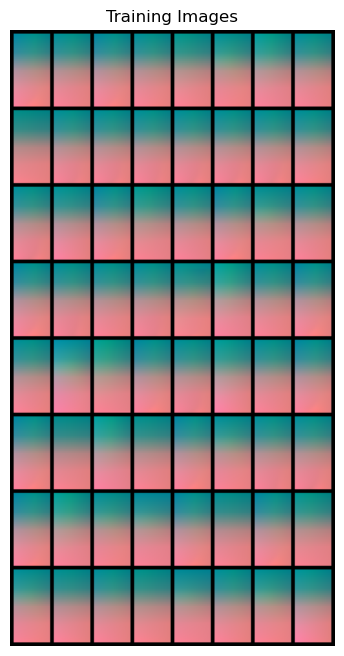

(16, 3, 40, 20)


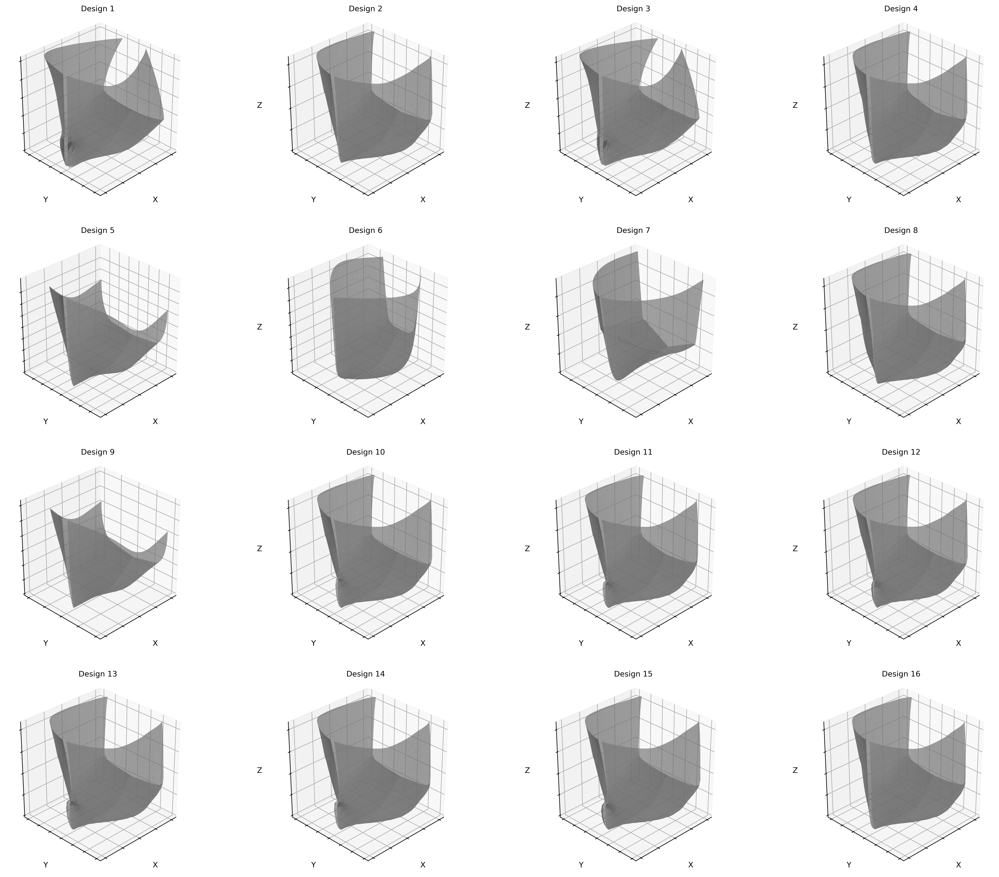

In [39]:
# Load data
tensor_data = load_data(data_root)

# Create a simple DataLoader to calculate stats
dataloader = torch.utils.data.DataLoader(CustomDataset(tensor_data), batch_size=batch_size, shuffle=True, drop_last=True)

mean, stdev = get_stats(dataloader)
print(f'\nPixel Mean: {mean}, Pixel Stdev: {stdev}')

# Plot some training images
real_batch = next(iter(dataloader))
print(real_batch.shape)

# plot tiled rgb images
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch.to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

# Convert to numpy and plot first 4 designs - 3D Vessels Geometries
designs = real_batch[:16].cpu().numpy()
print(designs.shape)
fig = plot_design_grid_mpl(designs, rows=4, cols=4)
plt.show()

Advanced Methods
================

1. ~~Apply Spectral Norm~~
2. Add squeeze and excitation block

In [22]:
# simple addition layer of gaussian instance noise 
# suggested in https://arxiv.org/abs/1906.04612
class GaussianNoise(nn.Module):
    # sigma: sigma*pixel value = stdev of added noise from normal distribution 
    def __init__(self, sigma=0.1):
        super().__init__()
        self.sigma = sigma
        self.register_buffer('noise', torch.tensor(0))

    def forward(self, x):
        if self.training and self.sigma != 0:
            # scale of noise = stdev of gaussian noise = sigma * pixel value 
            scale = self.sigma * x.detach()
            sampled_noise = self.noise.expand(*x.size()).float().normal_() * scale
            x = x + sampled_noise
        return x 
    
# spectralnorm constrains the Lipschitz constant (strong form of uniform continuity) of the convolutional filters 
# i.e. discriminator(x), discriminator(y) will be sufficiently close granted that distribution of (x) and (y) are sufficiently close 
# stabilizes the training of the| discriminator network. works well in practice, but slows down discriminator
# may need to adust discriminator learning rate (2-4x greater than that of generator)
class SpectralNorm(nn.Module):
    def __init__(self, module):
        super().__init__()
        self.module = nn.utils.spectral_norm(module)
    def forward(self, x):
        return self.module(x)


Implementation
==============

With our input parameters set and the dataset prepared, we can now get
into the implementation. We will start with generator, discriminator, weight initialization, loss functions,
and training loop.


Generator
=========

The generator, $G$, is designed to map the latent space vector ($z$) to
data-space. Since our data are images, converting $z$ to data-space
means ultimately creating a RGB image with the same size as the training
images (i.e. 3x64x64). In practice, this is accomplished through a
series of strided two dimensional convolutional transpose layers, each
paired with a 2d batch norm layer and a relu activation. The output of
the generator is fed through a tanh function to return it to the input
data range of $[-1,1]$. It is worth noting the existence of the batch
norm functions after the conv-transpose layers, as this is a critical
contribution of the DCGAN paper. These layers help with the flow of
gradients during training. An image of the generator from the DCGAN
paper is shown below.

<img src="images/discrim_generator_net_1.png" alt="drawing" width="1250"/>
<!-- 
![drawing](images/discrim_generator_net_1.png){width=100} -->

Notice, how the inputs we set in the input section (`nz`, `ngf`, and
`nc`) influence the generator architecture in code. `nz` is the length
of the z input vector, `ngf` relates to the size of the feature maps
that are propagated through the generator, and `nc` is the number of
channels in the output image (set to 3 for x, y, z geometries). Below is the
code for the generator.


## To Do
1. ~~Add spectral norm to the generator (every conv2d_transpose_block)~~
2. check bias in functions


In [23]:
class Generator(nn.Module):
    def __init__(self, ngpu, nz, ngf, nc, use_spectral_norm=False):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.use_spectral_norm = use_spectral_norm  # flag for spectral normalization
        
        # Apply spectral normalization conditionally
        def spectral_norm_if(layer):
            return SpectralNorm(layer) if self.use_spectral_norm else layer
        
        self.main = nn.Sequential(
            # Input: Z latent vector (nz) x 1 x 1
            spectral_norm_if(nn.ConvTranspose2d(nz, ngf * 8, kernel_size=3, stride=1, padding=0, bias=False)),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # Shape: (ngf*8) x 3 x 3
            
            spectral_norm_if(nn.ConvTranspose2d(ngf * 8, ngf * 4, kernel_size=3, stride=2, padding=1, bias=False)),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # Shape: (ngf*4) x 5 x 5
            
            spectral_norm_if(nn.ConvTranspose2d(ngf * 4, ngf * 2, kernel_size=(4, 3), stride=(2, 1), padding=(1, 1), bias=False)),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # Shape: (ngf*2) x 10 x 5
            
            spectral_norm_if(nn.ConvTranspose2d(ngf * 2, ngf, kernel_size=4, stride=2, padding=1, bias=False)),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # Shape: (ngf) x 20 x 10
            
            spectral_norm_if(nn.ConvTranspose2d(ngf, nc, kernel_size=4, stride=2, padding=1, bias=False)),
            nn.Tanh()
            # Final output shape: (nc) x 40 x 20
        )

    def forward(self, input):
        return self.main(input)


Discriminator
=============

As mentioned, the discriminator, $D$, is a binary classification network
that takes an image as input and outputs a scalar probability that the
input image is real (as opposed to fake). Here, $D$ takes a 3x64x64
input image, processes it through a series of Conv2d, BatchNorm2d, and
LeakyReLU layers, and outputs the final probability through a Sigmoid
activation function. This architecture can be extended with more layers
if necessary for the problem, but there is significance to the use of
the strided convolution, BatchNorm, and LeakyReLUs. The DCGAN paper
mentions it is a good practice to use strided convolution rather than
pooling to downsample because it lets the network learn its own pooling
function. Also batch norm and leaky relu functions promote healthy
gradient flow which is critical for the learning process of both $G$ and
$D$.

## To Do
1. ~~Add spectral norm to the generator (every conv2d_transpose_block)~~
2. ~~Add drop out every layer~~


In [24]:
class Discriminator(nn.Module):
    def __init__(self, ngpu, nc, ndf, use_spectral_norm=False, use_dropout=False, dropout_prob=0.3):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.use_spectral_norm = use_spectral_norm
        self.use_dropout = use_dropout
        self.dropout_prob = dropout_prob  # Dropout probability

        # Conditionally apply spectral normalization
        def spectral_norm_if(layer):
            return SpectralNorm(layer) if self.use_spectral_norm else layer

        def batch_norm_if(layer):
            return nn.Identity() if self.use_spectral_norm else nn.BatchNorm2d(layer)
        
        # Conditionally apply dropout
        def dropout_if():
            return nn.Dropout(self.dropout_prob) if self.use_dropout else nn.Identity()

        def dropout_first():
            return nn.Identity() if self.use_dropout else nn.Dropout(0.5)

        self.main = nn.Sequential(
            # input is `(nc) x 40 x 20
            GaussianNoise(),
            dropout_first(),
            
            spectral_norm_if(nn.Conv2d(nc, ndf, (4,4), (2,2), (1,1), bias=False)),
            nn.LeakyReLU(0.2, inplace=True),
            dropout_if(),
            # state size. `(ndf) x 20 x 10
            
            spectral_norm_if(nn.Conv2d(ndf, ndf * 2, (4,4), (2,2), (1,1), bias=False)),
            batch_norm_if(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            dropout_if(),
            # state size. `(ndf*2) x 10 x 5
            
            spectral_norm_if(nn.Conv2d(ndf * 2, ndf * 4, (4,3), (2,1), (1,1), bias=False)),
            batch_norm_if(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            dropout_if(),
            # state size. `(ndf*4) x 5 x 5
            
            spectral_norm_if(nn.Conv2d(ndf * 4, ndf * 8, (3,3), (2,2), (1,1), bias=False)),
            batch_norm_if(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            dropout_if(),
            # state size. `(ndf*8) x 3 x 3
            
            nn.Conv2d(ndf * 8, 1, (3,3), (1,1), (0,0), bias=False),
            nn.Sigmoid()
            # state size. 1 x 1 x 1
        )

    def forward(self, input):
        return self.main(input).view(-1, 1).squeeze(1)


Check architecture dimensions
----------------------------

In [25]:
def print_layer_shapes(model, input_shape, device="cpu"):
    """
    Prints the output shape of each layer in the model
    
    Args:
        model: PyTorch model
        input_shape: tuple of (batch_size, channels, height, width)
        device: device to run the model on
    """
    x = torch.randn(input_shape).to(device)
    print(f"Input shape: {x.shape}")
    
    # Create a new Sequential model that we can step through
    layers = list(model.main.children())
    
    # Pass input through each layer and print shape
    for i, layer in enumerate(layers):
        x = layer(x)
        print(f"Layer {i} ({layer.__class__.__name__}): {x.shape}")
    
    return x.shape

# # Create the generator and discriminator
# netG = Generator(ngpu, nz, ngf, nc).train().to(device)
# netD = Discriminator(ngpu, nc, ndf, use_spectral_norm=True, use_dropout=True, dropout_prob=0.3).train().to(device)

# print("\nDiscriminator shape analysis:")
# disc_input_shape = (batch_size, nc, 40, 20)  # Should match Generator output
# print_layer_shapes(netD, disc_input_shape, device)

# print("\nGenerator shape analysis:")
# gen_input_shape = (batch_size, nz, 1, 1)
# gen_output_shape = print_layer_shapes(netG, gen_input_shape, device)


Weight Initialization
---------------------

From the DCGAN paper, the authors specify that all model weights shall
be randomly initialized from a Normal distribution with `mean=0`,
`stdev=0.02`. The `weights_init` function takes an initialized model as
input and reinitializes all convolutional, convolutional-transpose, and
batch normalization layers to meet this criteria. This function is
applied to the models immediately after initialization.


In [26]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# # generates a latent vector (z) sampled from a standard normal (Gaussian) distribution
# # adapted from https://discuss.pytorch.org/t/check-gradient-flow-in-network/15063/10
# def get_gaussian_latent_vectors(batch_size, device):
#     return torch.randn((batch_size, latent_vector_dim), device=device)

# function to plot gradients after training loop is over 
# will make it obvious if any gradients are exploding/vanishing
# goes into training loop after loss.backwards()
# def plot_grad_flow(named_parameters):
#     ave_grads = []
#     max_grads= []
#     layers = []
#     for n, p in named_parameters:
#         if(p.requires_grad) and ("bias" not in n):
#             layers.append(n)
#             ave_grads.append(p.grad.abs().mean())
#             max_grads.append(p.grad.abs().max())
#     plt.bar(np.arange(len(max_grads)), max_grads, alpha=0.1, lw=1, color="c")
#     plt.bar(np.arange(len(max_grads)), ave_grads, alpha=0.1, lw=1, color="b")
#     plt.hlines(0, 0, len(ave_grads)+1, lw=2, color="k" )
#     plt.xticks(range(0,len(ave_grads), 1), layers, rotation="vertical")
#     plt.xlim(left=0, right=len(ave_grads))
#     plt.ylim(bottom = -0.001, top=0.02) # zoom in on the lower gradient regions
#     plt.xlabel("Layers")
#     plt.ylabel("average gradient")
#     plt.title("Gradient flow")
#     plt.grid(True)
#     plt.legend([Line2D([0], [0], color="c", lw=4),
#                 Line2D([0], [0], color="b", lw=4),
#                 Line2D([0], [0], color="k", lw=4)], ['max-gradient', 'mean-gradient', 'zero-gradient'])

Loss Functions and Optimizers
=============================

With $D$ and $G$ setup, we can specify how they learn through the loss
functions and optimizers. We will use the Binary Cross Entropy loss
([BCELoss](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html#torch.nn.BCELoss))
function which is defined in PyTorch as:

$$\ell(x, y) = L = \{l_1,\dots,l_N\}^\top, \quad l_n = - \left[ y_n \cdot \log x_n + (1 - y_n) \cdot \log (1 - x_n) \right]$$

Notice how this function provides the calculation of both log components
in the objective function (i.e. $log(D(x))$ and $log(1-D(G(z)))$). We
can specify what part of the BCE equation to use with the $y$ input.
This is accomplished in the training loop which is coming up soon, but
it is important to understand how we can choose which component we wish
to calculate just by changing $y$ (i.e. GT labels).

Next, we define our real label as 1 and the fake label as 0. These
labels will be used when calculating the losses of $D$ and $G$, and this
is also the convention used in the original GAN paper. Finally, we set
up two separate optimizers, one for $D$ and one for $G$. As specified in
the DCGAN paper, both are Adam optimizers with learning rate 0.0002 and
Beta1 = 0.5. For keeping track of the generator's learning progression,
we will generate a fixed batch of latent vectors that are drawn from a
Gaussian distribution (i.e. fixed\_noise) . In the training loop, we
will periodically input this fixed\_noise into $G$, and over the
iterations we will see images form out of the noise.

## TO DO:
1. ~~apply space filling loss~~
2. ~~apply laplacian loss~~ (Maybe substitute with TV loss)
3. Revise Gaussian Noise (Question: Why does edges truncate when apply. i.e. large gap forms near centerline.)


In [27]:
def compute_space_filling_loss(designs, current_step, total_steps, gamma=1e-5, p=5):
    """
    Computes the space-filling loss based on the Audze-Eglais criterion using vectorized operations.
    D_ij = ||x_i - x_j||^2 = ||x_i||^2 + ||x_j||^2 - 2 * (x_i . x_j)
    
    Args:
        designs (torch.Tensor): A tensor of generated designs, shape (m, d),
                                where m is the number of designs and d is the feature dimension.
        gamma (float): The final value of the space-filling term weight at the end of training. (gamma= 1e-5)
        current_step (int): The current training step.
        total_steps (int): The total number of training steps.
        p (float): Controls the steepness of the escalation of gamma. (p=5)
    
    Returns:
        torch.Tensor: The space-filling loss term S and scheduler gamma_t
    """
    designs = designs.view(designs.size(0), -1)  # Flatten for loss calculation
    m = designs.size(0)
    
    # Compute pairwise squared Euclidean distances
    squared_norms = torch.sum(designs ** 2, dim=1, keepdim=True)  # Shape: (m, 1)
    distance_matrix = squared_norms + squared_norms.t() - 2 * torch.mm(designs, designs.t())
    
    # Add a small epsilon to the diagonal to avoid division by zero
    distance_matrix += torch.eye(m, device=designs.device) * 1e-10
    
    # Compute 1 / distance for all pairs and sum up
    S = torch.sum(1.0 / distance_matrix)
    
    # Calculate current gamma value based on escalation schedule
    gamma_t = gamma * (current_step / total_steps) ** p

    return S, gamma_t


def laplacian_loss(geometry):
    """
    Computes the Laplacian smoothness loss for a 3D geometry grid.

    Parameters:
    geometry (torch.Tensor): Tensor of shape (b, c, H, W), where b is the batch size, c is channels,
                             and H and W are the grid dimensions.

    Returns:
    torch.Tensor: The Laplacian loss.
    """
    # Shifted versions of the geometry tensor
    geom_left = geometry[:, :, :-1, :-1]
    geom_right = geometry[:, :, 1:, :-1]
    geom_up = geometry[:, :, :-1, 1:]
    geom_down = geometry[:, :, :-1, :-1]

    # Compute Laplacian differences
    laplacian_diff = (geometry[:, :, :-1, :-1] - 0.25 * (geom_left + geom_right + geom_up + geom_down))
    laplacian_loss = laplacian_diff.norm(2)  # L2 norm

    return laplacian_loss


def gaussian_smoothing(geometry, kernel_size=5, sigma=1.0):
    """
    Applies Gaussian smoothing to a 3D geometry grid.

    Parameters:
    geometry (torch.Tensor): Tensor of shape (b, c, H, W).
    kernel_size (int): Size of the Gaussian kernel.
    sigma (float): Standard deviation of the Gaussian kernel.

    Returns:
    torch.Tensor: Smoothed geometry tensor.
    """
    # Create a 2D Gaussian kernel
    x = torch.arange(-kernel_size // 2 + 1, kernel_size // 2 + 1)
    x = x.view(1, -1).repeat(kernel_size, 1)
    y = x.T
    kernel = torch.exp(-(x**2 + y**2) / (2 * sigma**2))
    kernel = kernel / torch.sum(kernel)
    
    kernel = kernel.view(1, 1, kernel_size, kernel_size)  # Reshape for 2D convolution
    kernel = kernel.repeat(geometry.size(1), 1, 1, 1)  # Apply to each channel
    
    padding = kernel_size // 2
    padded_tensor = nn.functional.pad(geometry, (padding, padding, padding, padding), mode='reflect')
    smoothed_geometry = nn.functional.conv2d(padded_tensor, kernel, groups=geometry.size(1))
   
    return smoothed_geometry


Training
========

Be mindful that training GANs is somewhat of an art
form, as incorrect hyperparameter settings lead to mode collapse with
little explanation of what went wrong. We will closely follow
Algorithm 1 from the [Goodfellow's
paper](https://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf),
while abiding by some of the best practices shown in
[ganhacks](https://github.com/soumith/ganhacks). Namely, we will
"construct different mini-batches for real and fake" images, and also
adjust G's objective function to maximize $log(D(G(z)))$. Training is
split up into two main parts. Part 1 updates the Discriminator and Part
2 updates the Generator.

**Part 1 - Train the Discriminator**

Recall, the goal of training the discriminator is to maximize the
probability of correctly classifying a given input as real or fake. In
terms of Goodfellow, we wish to "update the discriminator by ascending
its stochastic gradient". Practically, we want to maximize
$log(D(x)) + log(1-D(G(z)))$. Due to the separate mini-batch suggestion
from [ganhacks](https://github.com/soumith/ganhacks), we will calculate
this in two steps. First, we will construct a batch of real samples from
the training set, forward pass through $D$, calculate the loss
($log(D(x))$), then calculate the gradients in a backward pass.
Secondly, we will construct a batch of fake samples with the current
generator, forward pass this batch through $D$, calculate the loss
($log(1-D(G(z)))$), and *accumulate* the gradients with a backward pass.
Now, with the gradients accumulated from both the all-real and all-fake
batches, we call a step of the Discriminator's optimizer.

**Part 2 - Train the Generator**

As stated in the original paper, we want to train the Generator by
minimizing $log(1-D(G(z)))$ in an effort to generate better fakes. As
mentioned, this was shown by Goodfellow to not provide sufficient
gradients, especially early in the learning process. As a fix, we
instead wish to maximize $log(D(G(z)))$. In the code we accomplish this
by: classifying the Generator output from Part 1 with the Discriminator,
computing G's loss *using real labels as GT*, computing G's gradients in
a backward pass, and finally updating G's parameters with an optimizer
step. It may seem counter-intuitive to use the real labels as GT labels
for the loss function, but this allows us to use the $log(x)$ part of
the `BCELoss` (rather than the $log(1-x)$ part) which is exactly what we
want.

Finally, we will do some statistic reporting and at the end of each
epoch we will push our fixed\_noise batch through the generator to
visually track the progress of G's training. The training statistics
reported are:

-   **Loss\_D** - discriminator loss calculated as the sum of losses for
    the all real and all fake batches ($log(D(x)) + log(1 - D(G(z)))$).
-   **Loss\_G** - generator loss calculated as $log(D(G(z)))$
-   **D(x)** - the average output (across the batch) of the
    discriminator for the all real batch. This should start close to 1
    then theoretically converge to 0.5 when G gets better. Think about
    why this is.
-   **D(G(z))** - average discriminator outputs for the all fake batch.
    The first number is before D is updated and the second number is
    after D is updated. These numbers should start near 0 and converge
    to 0.5 as G gets better. Think about why this is.

**Note:** This step might take a while, depending on how many epochs you
run and if you removed some data from the dataset.


# New Training Loop - WITH LOGGING

Untested - previously unstable training (likely issue with double computing gradients in logger)

In [28]:
def train(training_config, dataloader, model_chpt=None, epochs=0):
    
    # configuration for training
    num_epochs = training_config['num_epochs']
    batch_size = training_config['batch_size']
    logdir = training_config['logdir']
    chkdir = training_config['chkptdir']
    
    # architecture structure
    nc = training_config['nc']
    ngf = training_config['ngf']
    ndf = training_config['ndf']
    snorm = training_config['arch_spectral']
    dropo = training_config['arch_dropout']    
    
    # hyperparameters
    nz = training_config['nz']
    lr = training_config['lr']
    beta1 = training_config['beta1']

    # enable tensorboard logging
    enable_tensorboard = training_config['enable_tensorboard']
  
    # need GPU/TPU for training purposes on such a heavy model and dataset
    #for TPU: device = device = xm.xla_device() 
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")    

    # Create the generator and discriminator
    netG = Generator(ngpu, nz, ngf, nc, use_spectral_norm=snorm).train().to(device)
    netD = Discriminator(ngpu, nc, ndf, use_spectral_norm=snorm, use_dropout=dropo).train().to(device)

    # Handle multi-GPU if desired
    if (device.type == 'cuda') and (ngpu > 1):
        netG = nn.DataParallel(netG, list(range(ngpu)))
        netD = nn.DataParallel(netD, list(range(ngpu)))


    if not model_chpt:
        # print(1)
        # Apply the ``weights_init`` function to randomly initialize all weights
        #  to ``mean=0``, ``stdev=0.02``.
        netG.apply(weights_init)
        netD.apply(weights_init)
        # instantiate optimizer
        optimizerD = optim.AdamW(netD.parameters(), lr=lr, betas=(beta1, 0.999)) # changed to Adam with Weigth decay AdamW
        optimizerG = optim.AdamW(netG.parameters(), lr=lr, betas=(beta1, 0.999)) # changed to Adam with Weigth decay AdamW
    else:
        # D_checkpoint = D
        # load discriminator weights from checkpoint
        netD.load_state_dict(model_chpt['discriminator_state_dict'])
        # instantiate optimizer and load state from checkpoint
        optimizerD = optim.AdamW(netD.parameters())
        optimizerD.load_state_dict(model_chpt['optimizerD_state_dict'])

        # G_checkpoint = G
        # load generator weights from discriminator
        netG.load_state_dict(model_chpt['generator_state_dict'])
        # instantiate optimizer and load state from checkpoint
        optimizerG = optim.AdamW(netG.parameters())
        optimizerG.load_state_dict(model_chpt['optimizerG_state_dict'])
        print(f'Epoch {epochs} checkpoint G model and optimizer state loaded\n')


    # Initialize the ``BCELoss`` function
    criterion = nn.BCELoss()
    # criterion = nn.BCEWithLogitsLoss() # if used remove sigmoid in discriminator (GANHacks)

    # Create batch of latent vectors that we will use to visualize
    #  the progression of the generator
    fixed_noise = torch.randn(16, nz, 1, 1, device=device)

    # Establish convention for real and fake labels during training
    # real_label = 1.
    real_label = 0.90 # one-sided label smoothing
    fake_label = 0.

    # Store losses for logging to TensorBoard
    D_losses = []
    G_losses = []
 
    # laplace and space-filling regularization constant
    lambda_laplacian = 1e-5
    gamma_spacefill = 1e-5
    p_spacefill = 5
    
    # measure training time (to get an idea of differences w.r.t. hyperparameters)
    # instantiate tensorboard 
    writer = SummaryWriter(logdir)  # (tensorboard) writer will output to ./runs/ directory by default
    start_time = time.time() 
 
    print("Starting Training Loop...")
    for epoch in range(epochs, epochs + num_epochs):
        # For each batch in the dataloader
        for i, data in enumerate(dataloader, 0):

            ############################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ###########################
            netD.zero_grad()  # Clear existing gradients for D

            ## Train with all-real batch
            real_cpu = data.to(device)
            b_size = real_cpu.size(0)

            # Create new label tensor for real samples
            real_label_tensor = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            
            # Forward pass real batch through D
            output_real = netD(real_cpu).view(-1)
            
            # Calculate loss on all-real batch
            errD_real = criterion(output_real, real_label_tensor)
            
            # Calculate gradients for D on real batch
            errD_real.backward()  # Backprop for real data
            D_x = output_real.mean().item()

            ## Train with all-fake batch
            # Generate batch of latent vectors
            noise = torch.randn(b_size, nz, 1, 1, device=device)
            
            # Generate fake image batch with G
            fake = netG(noise)

            # Create new label tensor for fake samples
            fake_label_tensor = torch.full((b_size,), fake_label, dtype=torch.float, device=device)

            # Classify all fake batch with D
            output_fake = netD(fake.detach()).view(-1)
            
            # Calculate D's loss on the all-fake batch
            errD_fake = criterion(output_fake, fake_label_tensor)
            
            # Backprop for fake data
            errD_fake.backward()
            D_G_z1 = output_fake.mean().item()
            
            # Combine real and fake loss for logging (not for backprop)
            errD = errD_real + errD_fake
            
            # Update D
            optimizerD.step()

            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################
            netG.zero_grad()  # Clear existing gradients for G

            # Create label tensor for generator loss (pretend fake is real)
            real_label_tensor_for_gen = torch.full((b_size,), real_label, dtype=torch.float, device=device)
            
            # Forward pass through D with fake images, but this time for G's gradients
            output = netD(fake).view(-1)
            
            # Calculate G's adversarial loss based on D's output
            errG = criterion(output, real_label_tensor_for_gen)

            # Add Laplacian loss to the generator loss
            if training_config['loss_laplace']:
                laplacian_loss_value = laplacian_loss(fake)
            else:
                laplacian_loss_value = 0.0
            
            # Add space-filling loss to the generator loss
            if training_config['loss_spacefill']:
                space_filling_loss, gamma_t = compute_space_filling_loss(
                    fake, 
                    current_step=i + epoch * len(dataloader), 
                    total_steps=(epochs + num_epochs) * len(dataloader), 
                    gamma=gamma_spacefill, 
                    p=p_spacefill
                )
            else:
                space_filling_loss, gamma_t = 0.0, 0.0

            # Total generator loss
            errG_total = errG + lambda_laplacian * laplacian_loss_value + gamma_t * space_filling_loss
            
            # Calculate gradients for G
            errG_total.backward()
            D_G_z2 = output.mean().item()
            
            # Update G
            optimizerG.step()
        
            ############################
            # (3) Logging - completely separated from training
            ############################
            if i % 50 == 0:  # Only log periodically to save computation
                with torch.no_grad():  # Ensure no gradients are computed during logging
                    # Store losses
                    G_losses.append(errG.item())  # .item() detaches from computation graph
                    D_losses.append(errD.item())
                    
                    if enable_tensorboard:
                        # Log scalar metrics
                        writer.add_scalars('Losses', {
                            'Generator': errG.item(),
                            'Discriminator': errD.item(),
                            'D_Real': errD_real.item(),
                            'D_Fake': errD_fake.item()
                        }, epoch * len(dataloader) + i)
                        
                        writer.add_scalars('Metrics', {
                            'D(x)': D_x,
                            'D(G(z))_before': D_G_z1,
                            'D(G(z))_after': D_G_z2
                        }, epoch * len(dataloader) + i)
                
                        # Log Laplacian loss if enabled
                        if training_config['loss_laplace']:
                            writer.add_scalar('Laplacian_Loss', laplacian_loss_value, epoch * len(dataloader) + i)

                        # Log Space-Filling loss and gamma if enabled
                        if training_config['loss_spacefill']:
                            writer.add_scalar('Space_Filling_Loss', space_filling_loss, epoch * len(dataloader) + i)
                            writer.add_scalar('Gamma_t', gamma_t, epoch * len(dataloader) + i)

                        # Generate and log images
                        fake_images = netG(fixed_noise).cpu().detach()  # Move to CPU before detaching
                        designs = fake_images.numpy()
                        
                        # Create visualization plots
                        fig = plot_design_grid_mpl(designs, rows=4, cols=4) # make a 2x2 grid of 
                        img_tensor = mpl_to_tensor(fig)
                        writer.add_image('Generated Images Geos', img_tensor, epoch * len(dataloader) + i)
                        
                        # Create image grids
                        img_grid = vutils.make_grid(fake_images, normalize=True)
                        writer.add_image('Generated Images Grid', img_grid, epoch * len(dataloader) + i)
                        # real_grid = vutils.make_grid(real_cpu[:64].cpu(), normalize=True)
                        # writer.add_image('Real Images', real_grid, epoch * len(dataloader) + i)

                    # Print progress
                    print(f'[{epoch}/{epochs + num_epochs}][{i}/{len(dataloader)}] '
                        f'Time: {(time.time() - start_time):.2f}s | '
                        f'Loss_D: {errD.item():.4f} | Loss_G: {errG.item():.4f} | '
                        f'D(x): {D_x:.4f} | D(G(z)): {D_G_z1:.4f}/{D_G_z2:.4f}')

                    
        ############################
        # (4) Checkpoint saving
        ############################
        with torch.no_grad():
            
            torch.save({
                'epoch': epoch,
                'generator_state_dict': netG.state_dict(),
                'discriminator_state_dict': netD.state_dict(),
                'optimizerG_state_dict': optimizerG.state_dict(),
                'optimizerD_state_dict': optimizerD.state_dict(),
                'G_loss': errG.item(),
                'D_loss': errD.item(),
                'G_losses': G_losses,
            'D_losses': D_losses,
            }, f'{chkdir}/checkpoint_epoch_{epoch}.pt')

    # Close tensorboard writer
    writer.close()    
    
    return G_losses, D_losses
 

## Configure Training Params & Train Model

Training config is mostly for logging purposes. The batch_size was set by the dataloader in the first couple of cells, so make sure to change it there if you want to change it here. 


In [30]:
# configuration for training; mostly for logging
import itertools

# hyper parameter optimization
# lr = [1e-3, 2e-3, 5e-3, 1e-2]
# batch_size = [32, 64, 128]
# nz = [30, 25, 20]
# use_spectral_norm = [False, True]
# use_dropout= [False, True]
# space_loss = [False, True] 
# smooth_loss = [False, True]

lr = [2e-4]
batch_size = [128]
nz = [25]

# architecture parameters
use_spectral_norm=[False]  
use_dropout=[False]

# additional loss terms
space_loss=[False]
smooth_loss=[True]

# Currently fixed in training function: 
# laplace and space-filling regularization constant
# lambda_laplacian = 1e-5
# gamma_spacefill = 1e-5
# p_spacefill = 5
    

param_combos = itertools.product(lr, batch_size, nz, use_spectral_norm, use_dropout, space_loss, smooth_loss)
for lr, batch_size, nz, use_spectral_norm, use_dropout, space_loss, smooth_loss in param_combos:
    # lr{}_b{}_nz{}_sn{}_do{}_spl{}_sml{}
    logdir = f'./runs_v1/lr{lr}_b{batch_size}_nz{nz}_spnrm{use_spectral_norm}_do{use_dropout}_spl{space_loss}_sml{smooth_loss}'
    checkpointdir = f'./checkpoints_v1/lr{lr}_b{batch_size}_nz{nz}_spnrm{use_spectral_norm}_do{use_dropout}_spl{space_loss}_sml{smooth_loss}'
    os.makedirs(logdir, exist_ok=True)
    os.makedirs(checkpointdir, exist_ok=True)
    
    # Create a simple DataLoader to calculate stats
    dataloader = torch.utils.data.DataLoader(CustomDataset(tensor_data), batch_size=batch_size, shuffle=True, drop_last=True)

    training_config = {
        'num_epochs' : 500, # num_epochs more than necessary to enable manual stopping
        'enable_tensorboard' : True,
        'batch_size' : batch_size, # lower batch size is better for GAN; 128 used in Radford et al, lower works even better.
        'lr' : lr, 
        'beta1' : beta1,
        'nc' : nc, 
        'nz' : nz,
        'ngf' : ngf,
        'ndf' : ndf,
        'ngpu' : ngpu,
        'arch_spectral' : use_spectral_norm,
        'arch_dropout' : use_dropout,
        'loss_spacefill' : space_loss,
        'loss_laplace' : smooth_loss,
        'logdir' : logdir,
        'chkptdir' : checkpointdir
    }

        # use pretrained G/D loaded from checkpoint if desired
    G_losses, D_losses = train(training_config, dataloader) #G=generator, D=discriminator) 

Starting Training Loop...
[0/500][0/46] Time: 17.26s | Loss_D: 1.3957 | Loss_G: 0.6926 | D(x): 0.5081 | D(G(z)): 0.5105/0.5004
[1/500][0/46] Time: 71.22s | Loss_D: 1.1620 | Loss_G: 1.2841 | D(x): 0.7133 | D(G(z)): 0.5152/0.2509
[2/500][0/46] Time: 114.59s | Loss_D: 1.4330 | Loss_G: 0.7249 | D(x): 0.5374 | D(G(z)): 0.5434/0.4826
[3/500][0/46] Time: 162.98s | Loss_D: 1.3684 | Loss_G: 0.7536 | D(x): 0.4777 | D(G(z)): 0.4703/0.4646
[4/500][0/46] Time: 224.31s | Loss_D: 1.3851 | Loss_G: 0.7410 | D(x): 0.4640 | D(G(z)): 0.4673/0.4716
[5/500][0/46] Time: 274.94s | Loss_D: 1.3744 | Loss_G: 0.7571 | D(x): 0.4651 | D(G(z)): 0.4628/0.4625
[6/500][0/46] Time: 327.20s | Loss_D: 1.3816 | Loss_G: 0.7478 | D(x): 0.4625 | D(G(z)): 0.4643/0.4676
[7/500][0/46] Time: 381.22s | Loss_D: 1.3824 | Loss_G: 0.7484 | D(x): 0.4640 | D(G(z)): 0.4665/0.4672
[8/500][0/46] Time: 433.23s | Loss_D: 1.3842 | Loss_G: 0.7620 | D(x): 0.4556 | D(G(z)): 0.4595/0.4593
[9/500][0/46] Time: 481.85s | Loss_D: 1.3858 | Loss_G: 0.7

RuntimeError: File ./checkpoints_v1/lr0.0002_b128_nz25_snrm[False]_slTrue/checkpoint_epoch_162.pt cannot be opened.

Exception in thread Thread-28:
Traceback (most recent call last):
  File "c:\Users\kodendaal\AppData\Local\anaconda3\envs\Privi_311\Lib\threading.py", line 1045, in _bootstrap_inner
    self.run()
  File "C:\Users\kodendaal\AppData\Roaming\Python\Python311\site-packages\tensorboard\summary\writer\event_file_writer.py", line 244, in run
    self._run()
  File "C:\Users\kodendaal\AppData\Roaming\Python\Python311\site-packages\tensorboard\summary\writer\event_file_writer.py", line 289, in _run
    self._record_writer.flush()
  File "C:\Users\kodendaal\AppData\Roaming\Python\Python311\site-packages\tensorboard\summary\writer\record_writer.py", line 43, in flush
Exception in thread Thread-33:
Traceback (most recent call last):
  File "c:\Users\kodendaal\AppData\Local\anaconda3\envs\Privi_311\Lib\threading.py", line 1045, in _bootstrap_inner
Exception in thread Thread-31:
Traceback (most recent call last):
  File "c:\Users\kodendaal\AppData\Local\anaconda3\envs\Privi_311\Lib\threading.py", l

## Load Pre-Trained Checkpoints to Resume Training

We'll pass the loaded checkpoint to the training loop function and load the model and optimizer state dicts in there (to make sure Colab plays nicely). 

In [22]:
# path to saved GAN model checkpoint
chk_path = './checkpoints/checkpoint_epoch_199_051124.pt'

# load discriminator checkpoint
chk_model = torch.load(chk_path)
epoch = chk_model['epoch']
print('full GAN loaded from ', chk_path)
print('\n')

training_config = {
    'num_epochs' : 50, # num_epochs more than necessary to enable manual stopping
    'enable_tensorboard' : True,
    'batch_size' : batch_size, # lower batch size is better for GAN; 128 used in Radford et al, lower works even better.
    'lr' : lr, 
    'beta1' : beta1,
    'nc' : nc, 
    'nz' : nz,
    'ngf' : ngf,
    'ndf' : ndf,
    'ngpu' : ngpu,
    'arch_spectral' : use_spectral_norm,
    'arch_dropout' : use_dropout,
    'loss_spacefill' : space_loss,
    'loss_laplace' : smooth_loss,
    'logdir' : f'./runs_v1/lr{lr}_bsize{batch_size}_nz{nz}_snorm{use_spectral_norm}'
}

G_losses, D_losses = train(training_config, dataloader, model_chpt=chk_model, epoch=epoch)

full GAN loaded from  ./checkpoints/checkpoint_epoch_199_051124.pt


Epoch 199 checkpoint G model and optimizer state loaded

Starting Training Loop...
[199/204][0/46] Time: 0.93s | Loss_D: 0.7822 | Loss_G: 1.8307 | D(x): 0.5799 | D(G(z)): 0.1922/0.1763


KeyboardInterrupt: 

# Generated Images and Checkpoint Progression (Load and visualize)
 
Now we can check how the generator has progressed through the training epochs. 


Generating geometry


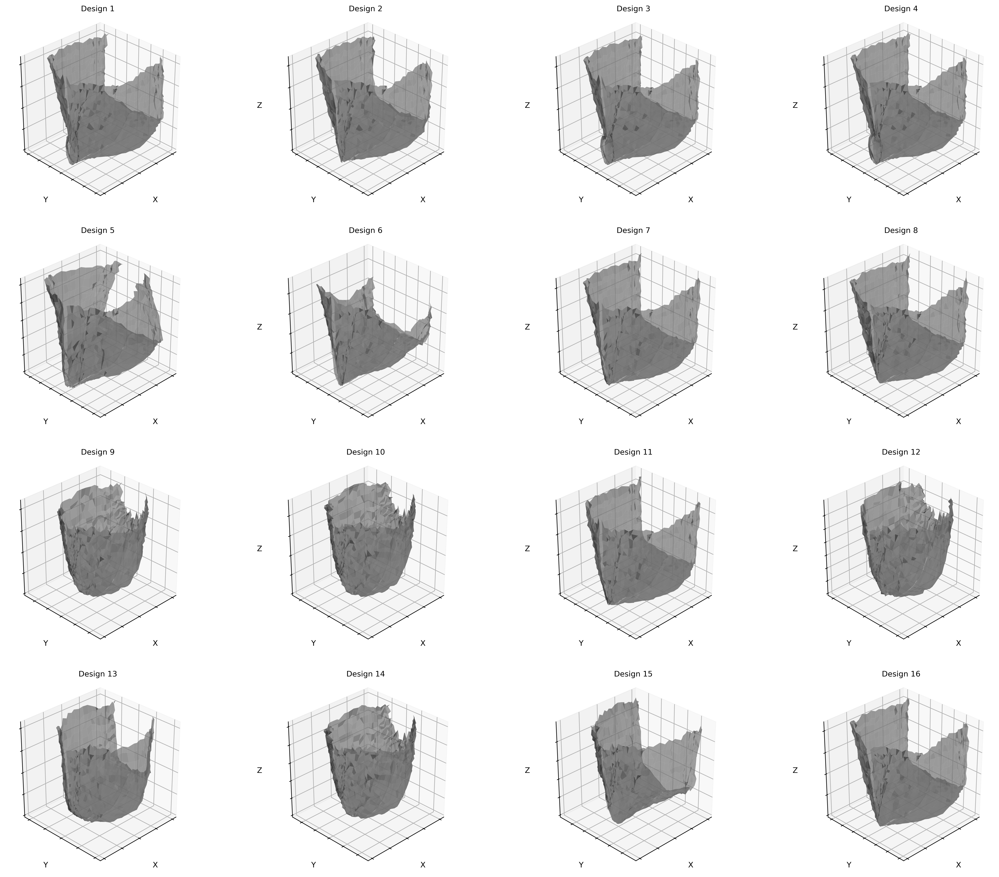

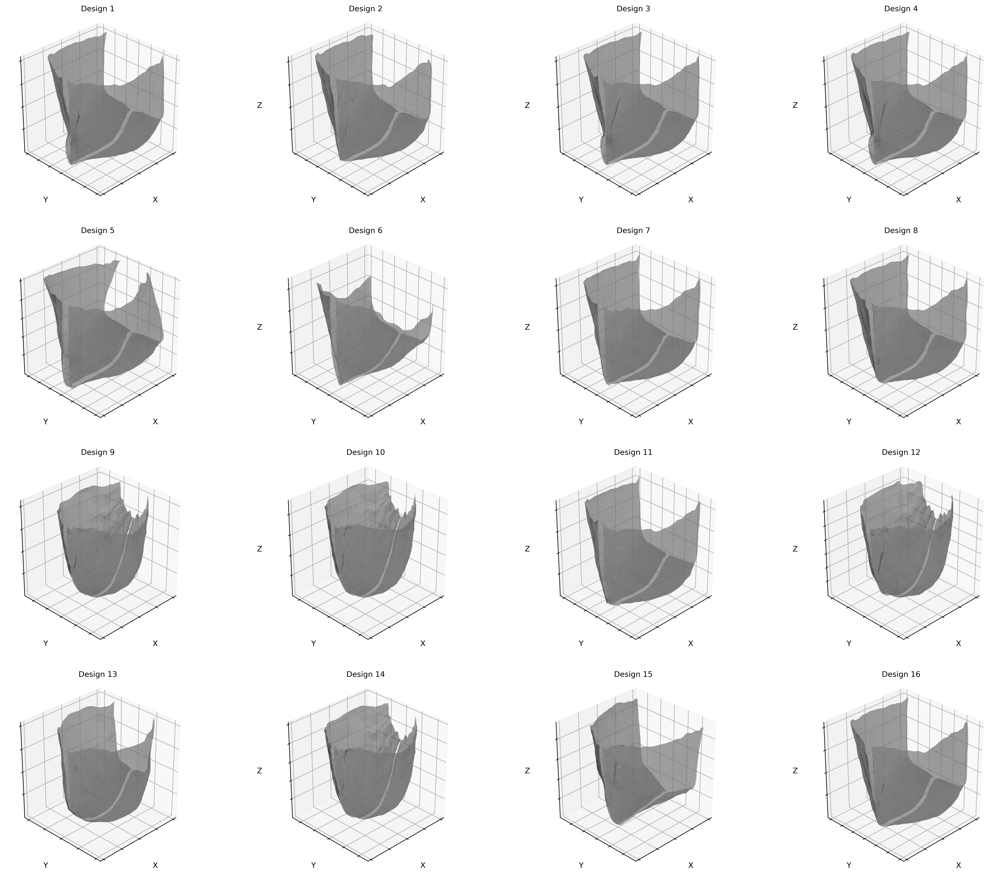

In [108]:
# select dedsired epoch
epoch = 499

# load the desired Generator checkpoint
model_path = f'./checkpoints/checkpoint_epoch_{epoch}_25_latent.pt' 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# instantiate model
nz = 25
generator = Generator(ngpu, nz, ngf, nc).to(device)

# load model weights from checkpoint
generator.load_state_dict(torch.load(model_path, map_location=torch.device('cpu'))['generator_state_dict'])

# set to validation phase: don't update gradients, no batchnorm in validation phase
generator.eval() 

# store generated images here 
generated_image_path = './images'

# Generate faces (using DCGAN Generator trained on CelebA)
print('Generating geometry')

test_noise = torch.randn(16, nz, 1, 1, device=device)
# Generate fake image batch with G
fake = generator(test_noise)

# Convert to numpy and plot first 4 designs
designs = fake.detach().cpu().numpy()
fig1 = plot_design_grid_mpl(designs, rows=4, cols=4)

# Define the Gaussian kernel size and standard deviation
kernel_size = 5  # Choose an odd number for symmetry
sigma = 0.7
smoothed_image = gaussian_smoothing(fake.detach().cpu(), kernel_size, sigma)
fig2 = plot_design_grid_mpl(smoothed_image.numpy(), rows=4, cols=4)


Training Loss Results
=======

Finally, lets check out how we did. Here, we will look at three
different results. First, we will see how D and G's losses changed
during training. Second, we will visualize G's output on the
fixed\_noise batch for every epoch. And third, we will look at a batch
of real data next to a batch of fake data from G.

**Loss versus training iteration**

Below is a plot of D & G's losses versus training iterations.


NameError: name 'G_losses' is not defined

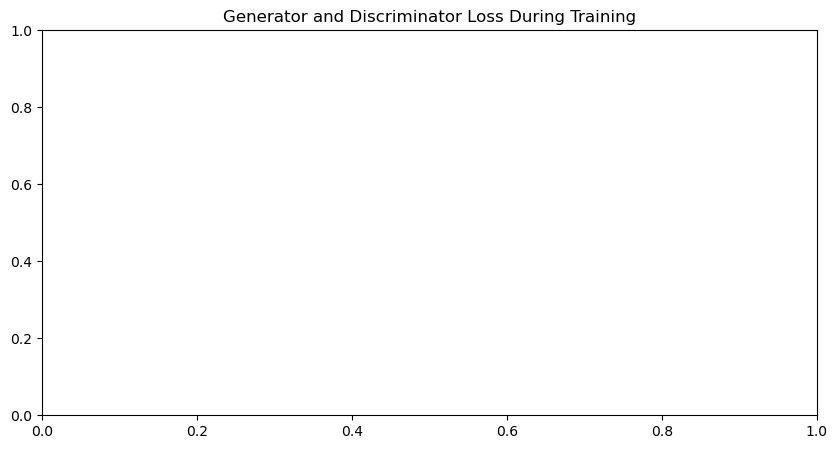

In [23]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.ylim([0, 5])
plt.legend()
plt.show()

**Visualization of G's progression**

Remember how we saved the generator's output on the fixed\_noise batch
after every epoch of training. Now, we can visualize the training
progression of G with an animation. Press the play button to start the
animation.


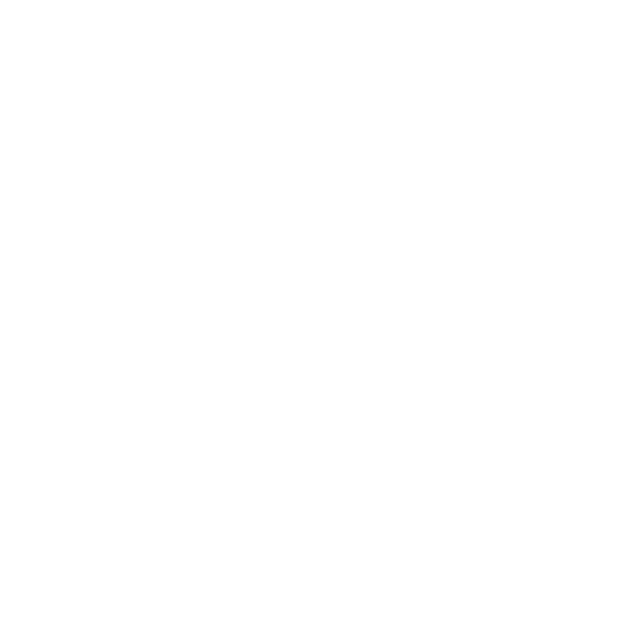

In [22]:
# fig = plt.figure(figsize=(8,8))
# plt.axis("off")
# ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
# ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
# HTML(ani.to_jshtml())